# Find the optimum Rotation of CTIO Data in January 2017
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : January 23 2017

The goal is to rotate the image correctly

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [21]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [22]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [23]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [24]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [25]:
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [26]:
from IPython.display import Image, display

In [27]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [28]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [29]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [30]:
inputdir="./cut_fitsimages"
object_name='HD60753'

In [31]:
#outputdir="./spectrum_fitsimages"
outputdir="./rotated_fitsimages"

In [32]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [33]:
input_filelist=os.listdir(inputdir) 

In [34]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [35]:
#print input_filelist

In [36]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [37]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                num_str=re.findall('^cutimg_HD60753_20170117_([0-9]+).fits',file)[0]
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

    


In [38]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [39]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [40]:
print indexes_files

[210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227
 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245
 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263
 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279 280 281
 282 283 284 285 286 287 289 290]


In [41]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [42]:
sorted_numbers=indexes_files[sorted_indexes]

In [43]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74
 75 76 77 78 79]


In [44]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [45]:
#sorted_files

## Build full filename
----------------------------

In [46]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [47]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [48]:
print sorted_filenames.shape

(80,)


## Acces to data of  images
----------------------------------

In [49]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []

In [50]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo

In [51]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [52]:
len(all_images)

80

In [53]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowImages(all_images,all_titles,object_name):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        xprofile=np.sum(all_images[index],axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(all_images[index],vmin=-10,vmax=50)
        axarr[iy,ix].set_title(all_titles[index])
    title='Images of '.format(object_name)
    plt.suptitle(title,size=16)
    return thex0

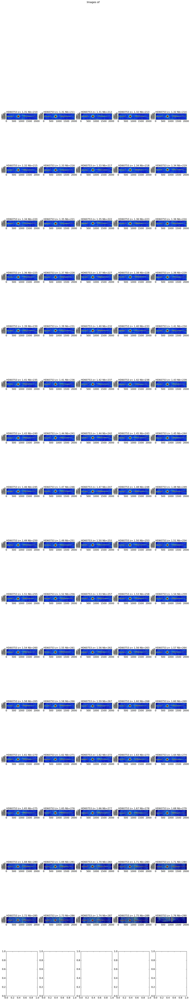

In [54]:
thex0=ShowImages(all_images,all_titles,object_name)

### Shows the transverse profile

In [55]:
DeltaX=600
w=20
ws=80

In [56]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowTransverseProfile(all_images,all_titles,object_name,all_expo):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    """

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    DeltaX=600
    w=20
    ws=80
    thespectra= []
    they0= []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        data=np.copy(all_images[index])
        data[:,DeltaX-ws:DeltaX+ws]=0
        if(index==0):
            yprofile=np.sum(data,axis=1)  #very special case
        else:
            yprofile=np.sum(data,axis=1)/all_expo[index]
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)
        thespectra.append(xprofile/(2.*float(w))/all_expo[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    return thespectra,they0

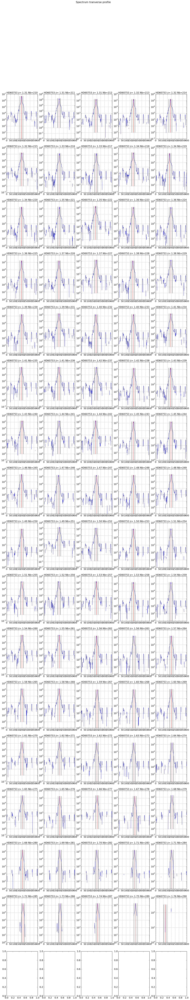

In [57]:
thespectra,they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo)

In [58]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowSpectrumProfile(spectra,all_titles,object_name):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5
        axarr[iy,ix].plot(spectra[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    title='Spectrum 1D profile '.format(object_name)
    plt.suptitle(title,size=16)

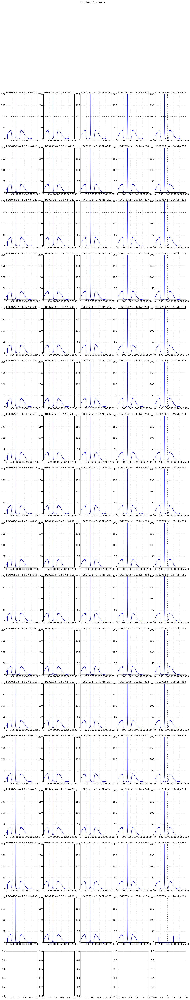

In [59]:
ShowSpectrumProfile(thespectra,all_titles,object_name)

In [60]:
print they0

[190, 194, 189, 193, 189, 194, 197, 193, 188, 177, 190, 197, 183, 188, 194, 190, 192, 191, 184, 194, 193, 192, 192, 191, 193, 187, 196, 193, 197, 189, 196, 194, 185, 191, 196, 190, 185, 200, 194, 199, 194, 197, 193, 194, 194, 199, 194, 198, 193, 194, 197, 199, 197, 201, 202, 200, 199, 204, 200, 201, 200, 203, 202, 198, 209, 204, 204, 206, 211, 211, 205, 206, 202, 207, 206, 211, 209, 213, 219, 123]


In [61]:
print thex0

[781, 780, 781, 780, 780, 780, 779, 779, 779, 778, 778, 778, 777, 777, 776, 776, 776, 775, 776, 776, 775, 775, 774, 775, 775, 774, 774, 774, 773, 774, 772, 773, 772, 771, 772, 770, 770, 770, 770, 770, 770, 769, 770, 768, 769, 768, 768, 768, 767, 767, 767, 765, 765, 765, 765, 765, 763, 764, 763, 763, 763, 762, 763, 763, 761, 762, 761, 761, 761, 760, 761, 761, 759, 761, 760, 761, 762, 761, 759, 1958]


### Test rotation optimum
----------------------------

In [62]:
from scipy import stats 
from scipy import ndimage
from scipy.optimize import curve_fit

In [63]:
sel=1

In [64]:
image_sel=np.copy(all_images[sel])
y0=they0[sel]
x0=thex0[sel]

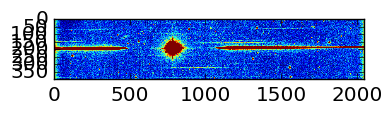

In [65]:
plt.imshow(image_sel,vmin=-10,vmax=50)

In [66]:
region=np.copy(image_sel[y0-100:y0+100,:])
data=np.copy(region)

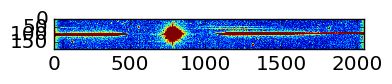

In [67]:
plt.imshow(data,vmin=-10,vmax=50)

### find the orientation by the average

In [68]:
def ComputeMedY(data):
    """
    Compute the median of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_medianY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_medianY[ix]=med
    return the_medianY

In [69]:
def ComputeAveY(data):
    """
    Compute the average of Y vs X to find later the angle of rotation
    """
    NBINSY=data.shape[0]
    NBINSX=data.shape[1]
    the_averY=np.zeros(NBINSX)
    the_y=np.zeros(NBINSY)
    for ix in np.arange(NBINSX):
        the_ysum=np.sum(data[:,ix])
        for iy in np.arange(NBINSY):
            the_y[iy]=iy*data[iy,ix]
        if(the_ysum>0):
            med=np.sum(the_y)/the_ysum
            the_averY[ix]=med
    return the_averY

In [70]:

xindex=np.arange(data.shape[1])

In [71]:
#selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))

In [72]:
selected_indexes=np.where(np.logical_and(np.logical_or(xindex<460,xindex>1100),xindex< 1500))

In [73]:
yaver=ComputeAveY(data)

In [74]:
XtoFit=xindex[selected_indexes]
YtoFit=yaver[selected_indexes]

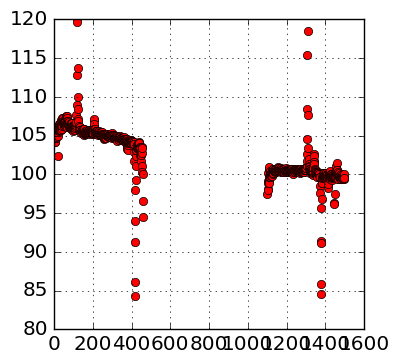

In [75]:
plt.plot(XtoFit,YtoFit,'ro')
plt.ylim(80,120)
plt.grid(True)

In [76]:
def fit_func(x, a, b):
    return a*x + b

In [77]:
from scipy.optimize import curve_fit
   

In [78]:
params = curve_fit(fit_func, XtoFit, YtoFit)
[a, b] = params[0]

In [79]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

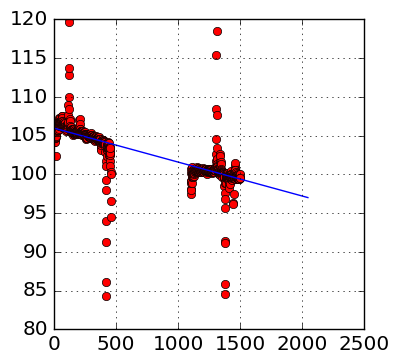

In [80]:
plt.plot(XtoFit,YtoFit,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(80,120)
plt.grid(True)

In [81]:
print a,b

-0.00437653241059 105.974006296


In [82]:
print np.arctan(a)*180/np.pi

-0.250755235045


## Find Rotation angle for each image
----------------------------------------------

In [83]:
def ComputeRotationAnge(all_images,thex0,they0,all_titles,object_name):
    """
    ComputeRotationAnge
    ===================
    
    input:
    ------
    all_images
    thex0
    they0
    
    
    output:
    ------
    param_a
    param_b
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    
    param_a=np.zeros(NBIMAGES)
    param_b=np.zeros(NBIMAGES)

    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        
        image=all_images[index]    
        
        image_sel=np.copy(image)
        y0=they0[index]
        x0=thex0[index]
        
        # extract a region of 200 x 1000 centered at y=100,x=500
        
        region=np.copy(image_sel[y0-100:y0+100,:])
        data=np.copy(region)
        
        xindex=np.arange(data.shape[1])
        #selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))
        selected_indexes=np.where(np.logical_and(np.logical_or(xindex<460,xindex>1100),xindex< 1500))
        # compute Y vs X
        yaver=ComputeAveY(data)
        
        XtoFit=xindex[selected_indexes]
        YtoFit=yaver[selected_indexes]
        # does the fit
        params = curve_fit(fit_func, XtoFit, YtoFit)
        [a, b] = params[0]
        
        param_a[index]=a
        param_b[index]=b
        
        print index,' y = ',a,' * x + ',b
        x_new = np.linspace(xindex.min(),xindex.max(), 50)
        y_new = fit_func(x_new,a,b)
    
        im=axarr[iy,ix].plot(XtoFit,YtoFit,'ro')
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        axarr[iy,ix].set_ylim(80,120)
        axarr[iy,ix].grid(True)
        
    title='Fit rotation angle of '.format(object_name)    
    plt.suptitle(title,size=16)
    return param_a,param_b
    
    

0  y =  -0.00448415629598  * x +  105.911193319
1  y =  -0.00437653241059  * x +  105.974006296
2  y =  -0.00448592973338  * x +  106.358315965
3  y =  -0.00445178535279  * x +  106.150241523
4  y =  -0.00443631053873  * x +  105.47276483
5  y =  -0.00444948696409  * x +  105.661027799
6  y =  -0.00453315474811  * x +  106.027706202
7  y =  -0.00438978569474  * x +  105.38431084
8  y =  -0.00443406093219  * x +  106.122720392
9  y =  -0.00442081085037  * x +  105.418512443
10  y =  -0.00441661341362  * x +  105.439846639
11  y =  -0.00437698720885  * x +  105.873011128
12  y =  -0.00432150798922  * x +  106.085842103
13  y =  -0.00438794353696  * x +  106.122866712
14  y =  -0.00437753637759  * x +  105.580301964
15  y =  -0.0043539389322  * x +  105.624886792
16  y =  -0.00433358357741  * x +  105.917422012
17  y =  -0.00436497403282  * x +  105.885638998
18  y =  -0.00438037008782  * x +  105.493211923
19  y =  -0.00431544380198  * x +  105.760011764
20  y =  -0.00433851667801  * x +

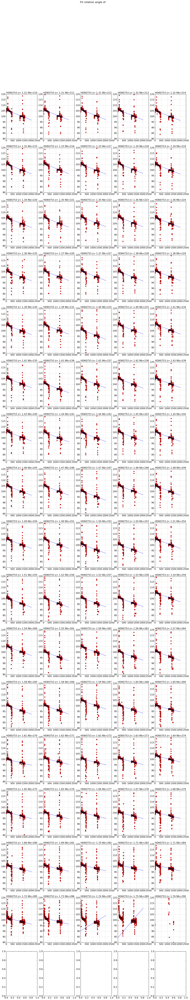

In [84]:
all_a,all_b=ComputeRotationAnge(all_images,thex0,they0,all_titles,object_name)

In [85]:
all_angles=np.arctan(all_a)*180./np.pi

### Choose here which rotation angle to apply

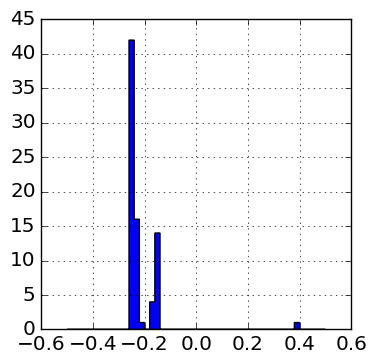

In [86]:
#hist(x, bins=10, range=None, normed=False, weights=None, cumulative=False, bottom=None, histtype='bar', align='mid', orientation='vertical', rwidth=None, log=False, color=None, label=None, stacked=False, hold=None, data=None, **kwargs)
n, bins, patches=plt.hist(all_angles,bins=50,range=[-.5,.5],histtype='stepfilled')
plt.grid(True)

In [87]:
selected_angles=all_angles[np.where(all_angles<-0.15)]

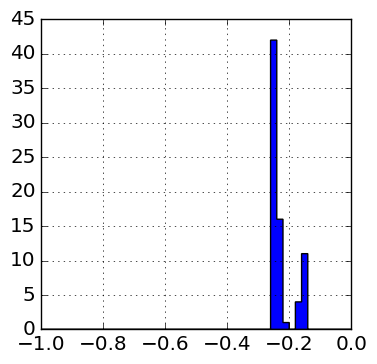

In [88]:
n, bins, patches=plt.hist(selected_angles,bins=50,range=[-1.,0],histtype='stepfilled')
plt.grid(True)

In [89]:
rotation_average=selected_angles.mean()

In [90]:
final_rotation_angles=np.ones(all_angles.shape[0])*rotation_average

## Now turn the images accordingly

In [91]:
def TurnTheImages(all_images,all_angles,all_titles,object_name):
    """
    TurnTheImages
    =============
    
    input:
    ------
    all_images:
    all_angles:
    
    
    output:
    ------
    all_rotated_images
    
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    
    all_rotated_images = []

    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        
        image=all_images[index]    
        angle=all_angles[index]    
        data=np.copy(image)
        
        rotated_image=ndimage.interpolation.rotate(data,angle)
        
        all_rotated_images.append(rotated_image)
        
        im=axarr[iy,ix].imshow(rotated_image,vmin=0,vmax=50)
        im=axarr[iy,ix].plot(x_new,y_new,'b-')
        axarr[iy,ix].set_title(all_titles[index])
        
        
        axarr[iy,ix].grid(True)
        
    title='Rotated images for '.format(object_name)    
    plt.suptitle(title,size=16)
    return all_rotated_images

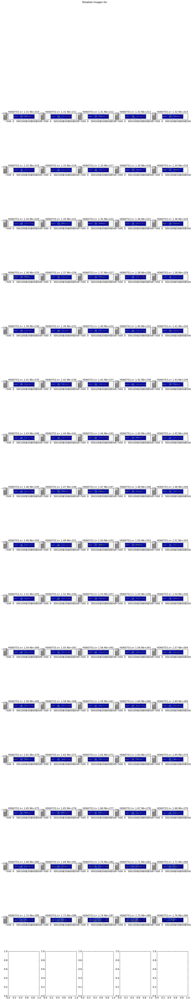

In [92]:
#turned_images=TurnTheImages(all_images,all_angles,all_titles,object_name)
turned_images=TurnTheImages(all_images,final_rotation_angles,all_titles,object_name) #same rotation for each image

## Check rotation

In case of bad rotation, check by eye

In [93]:
sel=106

In [94]:
plt.figure(figsize=(15,10))
plt.imshow(turned_images[sel],vmin=0,vmax=100)
plt.grid(True)

IndexError: list index out of range

In [ ]:
image_sel=np.copy(turned_images[sel])
y0=they0[sel]
x0=thex0[sel]

In [ ]:
region=np.copy(image_sel[y0-100:y0+100,:])
#region[:,500-100:500+100]=0
data=np.copy(region)

In [ ]:
xindex=np.arange(data.shape[1])

In [ ]:
#selected_indexes=np.where(np.logical_or(xindex<480,xindex>1100))
selected_indexes=np.where(np.logical_and(np.logical_or(xindex<460,xindex>1100),xindex< 1500))

In [ ]:
yaver=ComputeAveY(data)

In [ ]:
XtoFit=xindex[selected_indexes]
YtoFit=yaver[selected_indexes]

In [ ]:
params = curve_fit(fit_func, XtoFit, YtoFit)
[a, b] = params[0]

In [ ]:
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = fit_func(x_new,a,b)

In [ ]:
plt.plot(XtoFit,YtoFit,'ro')
plt.plot(x_new,y_new,'b-')
plt.ylim(80,120)
plt.grid(True)

### prepare outputfilename

In [ ]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [ ]:
newfullfilenames

### Save outputfilename

In [ ]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=turned_images[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)

In [ ]:
!ls

In [ ]:
# !ls -l cut_fitsimages